In [1]:
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image

#Libraries used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#sns.set_style("darkgrid")

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
import collections
from lightgbm import LGBMClassifier


from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, KFold
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from scipy.stats import norm
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

import keras
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
pd.set_option("display.max_columns", 999)
pd.get_option("display.max_columns")

pd.set_option("display.max_rows", 999)
pd.get_option("display.max_rows")

%matplotlib inline

Using TensorFlow backend.


In [2]:
#test_df = pd.read_csv("application_test.csv")
#test_df.head()

In [3]:
df = pd.read_csv("Prepared_Data/application_train_data.csv")
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,CNT_CHILDREN,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,INCOME_CLASS,REGION_POPULATION_RELATIVE,COMMONAREA_AVG,FLOORSMIN_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,YEARS_BUILD_MODE,YEARS_BEGINEXPLUATATION_MEDI,LANDAREA_MEDI,BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA,FLAG_OWN_REALTY,TOTAL_DOCUMENT_SUBMITTED_LE,TOTAL_DOCUMENT_SUBMITTED_GT,LOW_SKILLED_OCCUPATION,total_amt_req_credit_bureau,COMMUNICATION_CHANNEL_ALTERNATE,COMMUNICATION_CHANNEL_DIRECT,DEFAULT_SOCIAL_CIRCLE,OBS_SOCIAL_CIRCLE,Civil marriage,Married,Separated,Unmarried,Widow,Family,Unaccompanied,Municipal,Rented,own_house_apartment,with_parents,org spec account,reg oper account,reg oper spec account,Commercial associate,Pensioner,State servant,Working,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,High skill tech staff,Laborers,Managers,Medicine staff,Private service staff,Sales staff,Security staff,FRIDAY,MONDAY,SATURDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade,Transport,University,DIR,AIR,ACR,DAR,INCOME_PER_PERSON
0,100002,1,1,1,0,0,351000.0,2,-3648.0,-2120,0.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,-1134.0,2,0.018801,0.0143,0.1250,0.0000,0.0000,0.6341,0.9722,0.0375,0.1249,1,0,1,1.0,1.0,2,1,4.0,4.0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.007889,0.121978,0.060749,0.070513,101250.0
1,100003,0,1,0,0,0,1129500.0,4,-1186.0,-291,0.0,1,1,11,0,0,0,0,0,0,0.311267,0.622246,0.540000,-828.0,3,0.003541,0.0605,0.3333,0.0039,0.0098,0.8040,0.9851,0.0132,0.2223,0,0,1,0.0,0.0,2,1,0.0,2.0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4.790750,0.132217,0.027598,0.072464,90000.0
2,100004,0,0,1,1,0,135000.0,2,-4260.0,-2531,26.0,2,2,9,0,0,0,0,0,0,0.510000,0.555912,0.729567,-815.0,0,0.010032,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,0,0,1.0,0.0,3,1,0.0,0.0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.000000,0.100000,0.050000,0.012579,33750.0
3,100006,0,1,0,0,0,297000.0,2,-9833.0,-2437,0.0,2,2,17,0,0,0,0,0,0,0.510000,0.650442,0.540000,-617.0,1,0.008019,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,0,1,1.0,0.0,2,0,0.0,4.0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.316167,0.219900,0.094941,0.160377,45000.0
4,100007,0,1,1,0,0,513000.0,2,-4311.0,-3458,0.0,2,2,11,0,0,0,0,1,1,0.510000,0.322738,0.540000,-1106.0,1,0.028663,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,1,0,0.0,0.0,2,0,0.0,0.0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.222222,0.179963,0.042623,0.154545,60750.0


In [4]:
df.shape

(307511, 118)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 118 entries, SK_ID_CURR to INCOME_PER_PERSON
dtypes: float64(25), int64(93)
memory usage: 276.8 MB


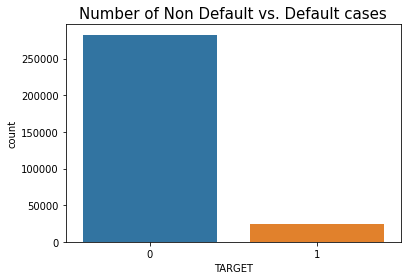

In [6]:
#Default vs. Non-Default
sns.countplot('TARGET', data=df)
plt.title('Number of Non Default vs. Default cases', fontsize = 15);

In [7]:
df.TARGET.value_counts()[1]

24825

In [8]:
print('Percentage of No Frauds: {}%'.format(round(df.TARGET.value_counts()[0]/len(df) * 100.0,2)))
print('Percentage of Frauds: {}%'.format(round(df.TARGET.value_counts()[1]/len(df) * 100.0,2)))

Percentage of No Frauds: 91.93%
Percentage of Frauds: 8.07%


In [9]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,CNT_CHILDREN,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,INCOME_CLASS,REGION_POPULATION_RELATIVE,COMMONAREA_AVG,FLOORSMIN_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,YEARS_BUILD_MODE,YEARS_BEGINEXPLUATATION_MEDI,LANDAREA_MEDI,BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA,FLAG_OWN_REALTY,TOTAL_DOCUMENT_SUBMITTED_LE,TOTAL_DOCUMENT_SUBMITTED_GT,LOW_SKILLED_OCCUPATION,total_amt_req_credit_bureau,COMMUNICATION_CHANNEL_ALTERNATE,COMMUNICATION_CHANNEL_DIRECT,DEFAULT_SOCIAL_CIRCLE,OBS_SOCIAL_CIRCLE,Civil marriage,Married,Separated,Unmarried,Widow,Family,Unaccompanied,Municipal,Rented,own_house_apartment,with_parents,org spec account,reg oper account,reg oper spec account,Commercial associate,Pensioner,State servant,Working,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,High skill tech staff,Laborers,Managers,Medicine staff,Private service staff,Sales staff,Security staff,FRIDAY,MONDAY,SATURDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade,Transport,University,DIR,AIR,ACR,DAR,INCOME_PER_PERSON
0,100002,1,1,1,0,0,351000.0,2,-3648.0,-2120,0.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,-1134.0,2,0.018801,0.0143,0.1250,0.0000,0.0000,0.6341,0.9722,0.0375,0.1249,1,0,1,1.0,1.0,2,1,4.0,4.0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.007889,0.121978,0.060749,0.070513,101250.0
1,100003,0,1,0,0,0,1129500.0,4,-1186.0,-291,0.0,1,1,11,0,0,0,0,0,0,0.311267,0.622246,0.540000,-828.0,3,0.003541,0.0605,0.3333,0.0039,0.0098,0.8040,0.9851,0.0132,0.2223,0,0,1,0.0,0.0,2,1,0.0,2.0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4.790750,0.132217,0.027598,0.072464,90000.0
2,100004,0,0,1,1,0,135000.0,2,-4260.0,-2531,26.0,2,2,9,0,0,0,0,0,0,0.510000,0.555912,0.729567,-815.0,0,0.010032,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,0,0,1.0,0.0,3,1,0.0,0.0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.000000,0.100000,0.050000,0.012579,33750.0
3,100006,0,1,0,0,0,297000.0,2,-9833.0,-2437,0.0,2,2,17,0,0,0,0,0,0,0.510000,0.650442,0.540000,-617.0,1,0.008019,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,0,1,1.0,0.0,2,0,0.0,4.0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.316167,0.219900,0.094941,0.160377,45000.0
4,100007,0,1,1,0,0,513000.0,2,-4311.0,-3458,0.0,2,2,11,0,0,0,0,1,1,0.510000,0.322738,0.540000,-1106.0,1,0.028663,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,1,0,0.0,0.0,2,0,0.0,0.0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.222222,0.179963,0.042623,0.154545,60750.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 118 entries, SK_ID_CURR to INCOME_PER_PERSON
dtypes: float64(25), int64(93)
memory usage: 276.8 MB


In [11]:
df.shape

(307511, 118)

In [12]:
corr_dict = dict()
for col in df.columns:
    if col != "TARGET":
        corr_score = df[col].corr(df.TARGET, method="spearman")
        if abs(corr_score) >=0.03:
            corr_dict[col] = corr_score
sorted_dict = {k: v for k, v in sorted(corr_dict.items(), key=lambda item:item[1])}
sorted_dict

{'EXT_SOURCE_2': -0.14713013026498475,
 'EXT_SOURCE_3': -0.14092260836891762,
 'EXT_SOURCE_1': -0.08491600464186333,
 'DAR': -0.0769340543711448,
 'NAME_EDUCATION_TYPE': -0.055737990719786974,
 'Pensioner': -0.0462094227866205,
 'YEARS_BEGINEXPLUATATION_MEDI': -0.04461031105063068,
 'BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA': -0.04055238709320317,
 'TOTAL_DOCUMENT_SUBMITTED_LE': -0.033811107004575326,
 'YEARS_BUILD_MODE': -0.03340990935703251,
 'FLOORSMIN_AVG': -0.03281586843642669,
 'NONLIVINGAREA_AVG': -0.031670273300648824,
 'AMT_GOODS_PRICE': -0.03144639159131311,
 'REGION_POPULATION_RELATIVE': -0.03056202737952561,
 'LANDAREA_MEDI': -0.030067024986800396,
 'Drivers': 0.030303499914947823,
 'ACR': 0.030895362198282383,
 'NAME_CONTRACT_TYPE': 0.030895908161048077,
 'LIVE_CITY_NOT_WORK_CITY': 0.03251834110149882,
 'DEFAULT_SOCIAL_CIRCLE': 0.03256052117864522,
 'DAYS_REGISTRATION': 0.040170675539009,
 'Laborers': 0.043018954955307796,
 'REG_CITY_NOT_LIVE_CITY': 0.044395374805700806,
 '

In [13]:
col_from_EDA = list(sorted_dict.keys())


In [14]:
col_from_EDA.append("SK_ID_CURR")
col_from_EDA.append("TARGET")

In [15]:
df = df[col_from_EDA]

In [16]:
df.isnull().sum()

EXT_SOURCE_2                               0
EXT_SOURCE_3                               0
EXT_SOURCE_1                               0
DAR                                        0
NAME_EDUCATION_TYPE                        0
Pensioner                                  0
YEARS_BEGINEXPLUATATION_MEDI               0
BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA    0
TOTAL_DOCUMENT_SUBMITTED_LE                0
YEARS_BUILD_MODE                           0
FLOORSMIN_AVG                              0
NONLIVINGAREA_AVG                          0
AMT_GOODS_PRICE                            0
REGION_POPULATION_RELATIVE                 0
LANDAREA_MEDI                              0
Drivers                                    0
ACR                                        0
NAME_CONTRACT_TYPE                         0
LIVE_CITY_NOT_WORK_CITY                    0
DEFAULT_SOCIAL_CIRCLE                      0
DAYS_REGISTRATION                          0
Laborers                                   0
REG_CITY_N

In [17]:
df = df.replace([-np.inf, np.inf], 1)

In [18]:
#Random Under Sampling
X = df.drop('TARGET', axis=1)
y = df['TARGET']


In [19]:
X = X.drop("SK_ID_CURR", axis=1)

In [20]:
#Split the data using train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
X_test.shape

(61503, 33)

In [22]:
df_stand = df.copy()

In [23]:
# data standardization with  sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
# copy of datasets
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()

# numerical features
num_cols = X_train_stand.columns

# apply standardization on numerical features
for i in num_cols:
    
    # fit on training data column
    #scale = StandardScaler()
    scale = MinMaxScaler(feature_range = (0, 1))
    
    # transform the training data column
    X_train_stand[i] = scale.fit_transform(X_train_stand[[i]])
    
    # transform the testing data column
    X_test_stand[i] = scale.transform(X_test_stand[[i]])
    #test_df_copy[i] = scale.transform(test_df[[i]])
    df_stand[i] = scale.transform(df_stand[[i]])

In [24]:
print('Before OverSampling, the shape of train_X: {}'.format(X_train_stand.shape)) 
print('Before OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("Before OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

Before OverSampling, the shape of train_X: (246008, 33)
Before OverSampling, the shape of train_y: (246008,) 

Before OverSampling, counts of label '1': 19876
Before OverSampling, counts of label '0': 226132


In [25]:
# SMOTE OVERSAMPLING
sm = SMOTE(random_state = 2) 
X_train_SMOTE, y_train_SMOTE = sm.fit_sample(X_train_stand, y_train.ravel()) 

In [26]:
print('After OverSampling, the shape of train_X: {}'.format(X_train_SMOTE.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_SMOTE.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_SMOTE == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_SMOTE == 0))) 

After OverSampling, the shape of train_X: (452264, 33)
After OverSampling, the shape of train_y: (452264,) 

After OverSampling, counts of label '1': 226132
After OverSampling, counts of label '0': 226132


In [27]:
#Convert to arrays to feed to the classifications algorithms
classifiers = {
    "Logistic Regression": LogisticRegression(class_weight='balanced',n_jobs=-1),
    "Support Vector Classifier": LinearSVC(class_weight='balanced',dual=False, random_state=0),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', max_depth=3),
    "RandomForest":RandomForestClassifier(class_weight='balanced_subsample',max_depth = 4, n_jobs=-1),
    "Gradient Boosting":XGBClassifier(objective='binary:logistic',max_depth =3, n_estimators=10, eval_metric='auc', seed=123, n_jobs=-1,verbosity=0)
}

In [30]:
#Calculate the cross-validation score for each classifier 8;24
print('Cross-Validation Scores:-')
for key, classifier in classifiers.items():
        classifier.fit(X_train_stand, y_train)
        cv_score = cross_val_score(classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='accuracy',n_jobs=-1)
        precision = cross_val_score(classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='precision',n_jobs=-1)
        recall = cross_val_score(classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='recall',n_jobs=-1)
        auc = cross_val_score(classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='roc_auc',n_jobs=-1)
        print('{}: {} : {} : {} : {}'.format(key,round(cv_score.mean()*100.0, 2),
                                     round(recall.mean()*100.0, 2),
                                     round(precision.mean()*100.0, 2),
                                     round(auc.mean()*100.0, 2),))
    

Cross-Validation Scores:-
Logistic Regression: 67.98 : 67.86 : 68.04 : 74.38
Support Vector Classifier: 67.98 : 67.77 : 68.05 : 74.38
Decision Tree: 66.98 : 78.26 : 63.97 : 71.61
RandomForest: 72.42 : 75.22 : 71.61 : 79.55
Gradient Boosting: 75.84 : 77.94 : 74.16 : 83.71


In [31]:
 params = {
    "Logistic Regression": {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
    "Support Vector Classifier": {'C': [0.5, 0.7, 0.9, 1]},
    "Decision Tree": {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))},
     "RandomForest": {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))},
     "Gradient Boosting":{
     "eta"    : [0.05, 0.10, 0.20, 0.25, 0.30 ] ,
     "max_depth"        : [ 3, 4, 5],
     "gamma"            : [ 0.1, 0.3, 0.4 ],
     "colsample_bytree" : [ 0.3, 0.5 , 0.7 ]
     }

}

In [32]:
#Using Grid search for finding the most optimal hyperparameters
def randomsearch(classifier, params):
    k = StratifiedKFold(n_splits=10)
    grid_classifier = RandomizedSearchCV(classifier, params, cv = k, n_jobs=-1)
    grid_classifier.fit(X_train_SMOTE, y_train_SMOTE)
    best_classifier = grid_classifier.best_estimator_
    return best_classifier

In [33]:
#Using Grid search for finding the most optimal hyperparameters
def gridsearch(classifier, params):
    grid_classifier = GridSearchCV(classifier, params,n_jobs=-1)
    grid_classifier.fit(X_train_SMOTE, y_train_SMOTE)
    best_classifier = grid_classifier.best_estimator_
    return best_classifier

In [34]:
#Scores after applying Grid Search
hyperparameter_tuned_classfier = dict()
print('Cross-Validation Scores after applying RandomSearch:-')
for key, classifier in classifiers.items():
    tuned_classifier = randomsearch(classifier,params[key])
    hyperparameter_tuned_classfier[key] =tuned_classifier
    cv_score = cross_val_score(tuned_classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='accuracy',n_jobs=-1)
    precision = cross_val_score(tuned_classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='precision',n_jobs=-1)
    recall = cross_val_score(tuned_classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='recall',n_jobs=-1)
    auc = cross_val_score(tuned_classifier, X_train_SMOTE, y_train_SMOTE, cv=StratifiedKFold(shuffle = True),scoring='roc_auc',n_jobs=-1)
    print('{}: {} : {} : {} : {}'.format(key,round(cv_score.mean()*100.0, 2),
                                     round(recall.mean()*100.0, 2),
                                     round(precision.mean()*100.0, 2),
                                     round(auc.mean()*100.0, 2),))

Cross-Validation Scores after applying RandomSearch:-
Logistic Regression: 67.98 : 67.84 : 68.01 : 74.38
Support Vector Classifier: 67.97 : 67.74 : 68.05 : 74.38
Decision Tree: 66.95 : 78.26 : 63.87 : 71.61
RandomForest: 71.82 : 73.53 : 70.84 : 78.89
Gradient Boosting: 81.4 : 82.34 : 81.23 : 89.9


In [28]:
from sklearn.model_selection import StratifiedKFold
from lightgbm import LGBMClassifier
import gc
lgb_X_train_stand = X_train_stand.copy()
lgb_X_train_stand["TARGET"] = y_train
folds = StratifiedKFold(n_splits= 10, shuffle=True, random_state=2020)
sub_preds = np.zeros(lgb_X_train_stand.shape[0])
feats = [f for f in lgb_X_train_stand.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]

for n_fold, (train_idx, valid_idx) in enumerate(folds.split(lgb_X_train_stand[feats], lgb_X_train_stand['TARGET'])):
    train_x, train_y = lgb_X_train_stand[feats].iloc[train_idx], lgb_X_train_stand['TARGET'].iloc[train_idx]
    valid_x, valid_y = lgb_X_train_stand[feats].iloc[valid_idx], lgb_X_train_stand['TARGET'].iloc[valid_idx]

    lgb = LGBMClassifier(n_estimators=1000, learning_rate=0.02, num_leaves=45, class_weight='balanced',
        colsample_bytree=0.85, max_depth=8, bagging_fraction=0.4,
        min_split_gain=0.022, min_child_weight=40, reg_alpha=0.04, reg_lambda=0.07,silent=-1, verbose=-1)

    lgb.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
        eval_metric= 'auc', verbose= 200, early_stopping_rounds= 100)

    sub_preds += lgb.predict_proba(lgb_X_train_stand[feats], num_iteration=lgb.best_iteration_)[:, 1] / folds.n_splits

    del train_x, train_y, valid_x, valid_y
    gc.collect()


[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
Training until validation scores don't improve for 100 rounds
[200]	training's auc: 0.777152	training's binary_logloss: 0.571368	valid_1's auc: 0.751361	valid_1's binary_logloss: 0.579379
[400]	training's auc: 0.795973	training's binary_logloss: 0.550744	valid_1's auc: 0.754982	valid_1's binary_logloss: 0.565938
[600]	training's auc: 0.810946	training's binary_logloss: 0.535644	valid_1's auc: 0.754992	valid_1's binary_logloss: 0.556965
Early stopping, best iteration is:
[511]	training's auc: 0.804439	training's binary_logloss: 0.542157	valid_1's auc: 0.755167	valid_1's binary_logloss: 0.560727
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
Training until validation scores don't improve for 100 rounds
[200]	training's auc: 0.776802	training's binary_logloss: 0.571586	valid_1's auc: 0.7527	valid_1's bina

In [35]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    #plt.figure()
    plt.title(title)
    if ylim is not None:
        ax.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

<module 'matplotlib.pyplot' from '/mnt/disks/user/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

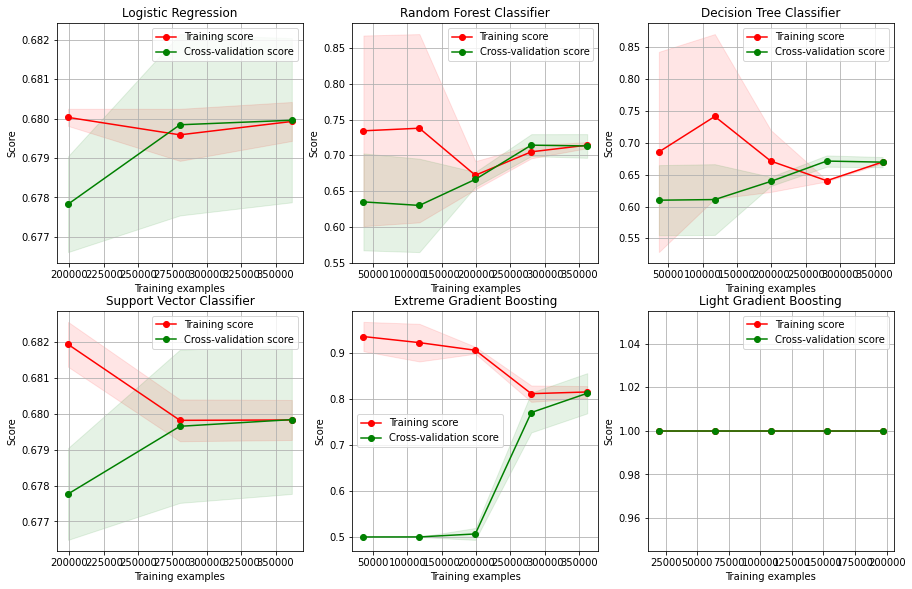

In [40]:
#Variables
n_jobs = 10
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

#Classifiers
log_reg = hyperparameter_tuned_classfier["Logistic Regression"]
svc = hyperparameter_tuned_classfier["Support Vector Classifier"]
decision_tree = hyperparameter_tuned_classfier["Decision Tree"]
RandomForest = hyperparameter_tuned_classfier["RandomForest"]
xgboost = hyperparameter_tuned_classfier["Gradient Boosting"]
lightgbm = lgb

plt.figure(figsize=(15,15))
plt.subplot(3,3,1)
plot_learning_curve(log_reg, 'Logistic Regression', X_train_SMOTE, y_train_SMOTE, n_jobs=-1)

plt.subplot(3,3,2)
plot_learning_curve(RandomForest, 'Random Forest Classifier', X_train_SMOTE, y_train_SMOTE, n_jobs=-1)

plt.subplot(3,3,3)
plot_learning_curve(decision_tree, 'Decision Tree Classifier', X_train_SMOTE, y_train_SMOTE, n_jobs=-1)

plt.subplot(3,3,4)
plot_learning_curve(svc, 'Support Vector Classifier', X_train_SMOTE, y_train_SMOTE, n_jobs=-1)

plt.subplot(3,3,5)
plot_learning_curve(xgboost, 'Extreme Gradient Boosting', X_train_SMOTE, y_train_SMOTE, n_jobs=-1)

plt.subplot(3,3,6)
plot_learning_curve(lightgbm, 'Light Gradient Boosting', X_train_stand, y_train, n_jobs=-1)

#plt.show()

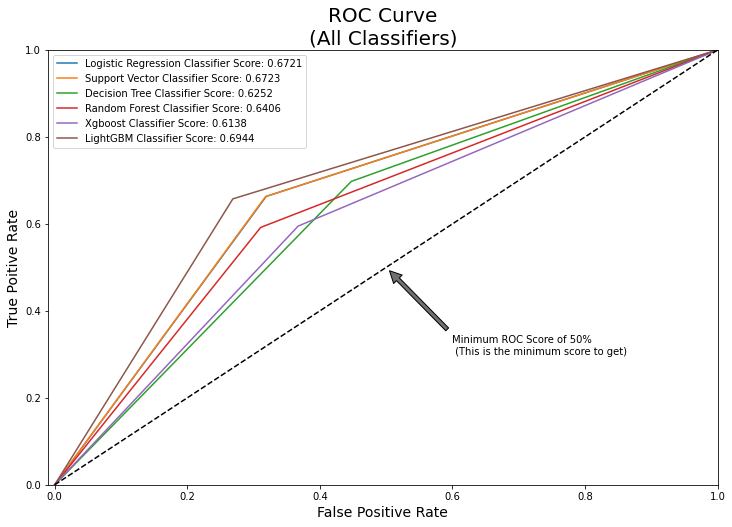

In [47]:
#ROC Curve
'''log_pred = cross_val_predict(log_reg, X_train, y_train, cv=5)
svc_pred = cross_val_predict(svc, X_train, y_train, cv=5)
tree_pred = cross_val_predict(decision_tree, X_train, y_train, cv=5)
knear_pred = cross_val_predict(knearest, X_train, y_train, cv=5)'''

log_pred = (log_reg.predict_proba(X_test_stand)[:,1] >= 0.5).astype(bool)
svc_pred = (svc._predict_proba_lr(X_test_stand)[:,1] >= 0.5).astype(bool)
tree_pred = decision_tree.predict(X_test_stand)
RandomForeest_pred = RandomForest.predict(X_test_stand)
Xgboost_pred = (xgboost.predict_proba(X_test_stand)[:,1] >= 0.4).astype(bool)
lgb_y_pred = (lgb.predict_proba(X_test_stand[feats],num_iteration=lgb.best_iteration_)[:,1] >= 0.5).astype(bool)

log_fpr, log_tpr, log_threshold = roc_curve(y_test, log_pred)
svc_fpr, svc_tpr, svc_threshold = roc_curve(y_test, svc_pred)
tree_fpr, tree_tpr, tree_threshold = roc_curve(y_test, tree_pred)
RF_fpr, RF_tpr, RF_threshold = roc_curve(y_test, RandomForeest_pred)
xgboost_fpr, xgboost_tpr, xgboost_threshold = roc_curve(y_test, Xgboost_pred)
lgb_fpr, lgb_tpr, lgb_threshold = roc_curve(y_test, lgb_y_pred)



plt.figure(figsize=(12,8))
plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(y_test, log_pred)))
plt.plot(svc_fpr, svc_tpr, label='Support Vector Classifier Score: {:.4f}'.format(roc_auc_score(y_test, svc_pred)))
plt.plot(tree_fpr, tree_tpr, label='Decision Tree Classifier Score: {:.4f}'.format(roc_auc_score(y_test, tree_pred)))
plt.plot(RF_fpr, RF_tpr, label='Random Forest Classifier Score: {:.4f}'.format(roc_auc_score(y_test, RandomForeest_pred)))
plt.plot(xgboost_fpr, xgboost_tpr, label='Xgboost Classifier Score: {:.4f}'.format(roc_auc_score(y_test, Xgboost_pred)))
plt.plot(lgb_fpr, lgb_tpr, label='LightGBM Classifier Score: {:.4f}'.format(roc_auc_score(y_test, lgb_y_pred)))

plt.plot([0,1],[0,1],'k--')
plt.axis([-0.01, 1, 0, 1])

plt.title('ROC Curve\n(All Classifiers)', fontsize=20)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Poitive Rate', fontsize=14)
plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
plt.legend()
plt.show()

In [46]:
labels = ['Non-Default', 'Default']

print('Logistic Regression:')
print(classification_report(y_test, log_pred, target_names=labels))

print('Support Vector Classifier:')
print(classification_report(y_test, svc_pred, target_names=labels))

print('Decision Tree:')
print(classification_report(y_test, tree_pred, target_names=labels))

print('Random Forest Classifier:')
print(classification_report(y_test, RandomForeest_pred, target_names=labels))

print('Extreme Gradient Boosting Classifier:')
print(classification_report(y_test, Xgboost_pred, target_names=labels))

print('Light Gradient Boosting Classifier:')
print(classification_report(y_test, lgb_y_pred, target_names=labels))


Logistic Regression:
              precision    recall  f1-score   support

 Non-Default       0.96      0.68      0.80     56554
     Default       0.15      0.66      0.25      4949

    accuracy                           0.68     61503
   macro avg       0.56      0.67      0.52     61503
weighted avg       0.89      0.68      0.75     61503

Support Vector Classifier:
              precision    recall  f1-score   support

 Non-Default       0.96      0.68      0.80     56554
     Default       0.15      0.66      0.25      4949

    accuracy                           0.68     61503
   macro avg       0.56      0.67      0.52     61503
weighted avg       0.89      0.68      0.75     61503

Decision Tree:
              precision    recall  f1-score   support

 Non-Default       0.95      0.55      0.70     56554
     Default       0.12      0.70      0.20      4949

    accuracy                           0.56     61503
   macro avg       0.54      0.63      0.45     61503
weighted av

In [48]:
import itertools

# Create a confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
        
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=14)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[38511 18043]
 [ 1667  3282]]
Confusion matrix, without normalization
[[38576 17978]
 [ 1670  3279]]
Confusion matrix, without normalization
[[31251 25303]
 [ 1496  3453]]
Confusion matrix, without normalization
[[38984 17570]
 [ 2020  2929]]
Confusion matrix, without normalization
[[20903 35651]
 [  833  4116]]
Confusion matrix, without normalization
[[40684 15870]
 [ 1630  3319]]
Confusion matrix, without normalization
[[56554     0]
 [    0  4949]]


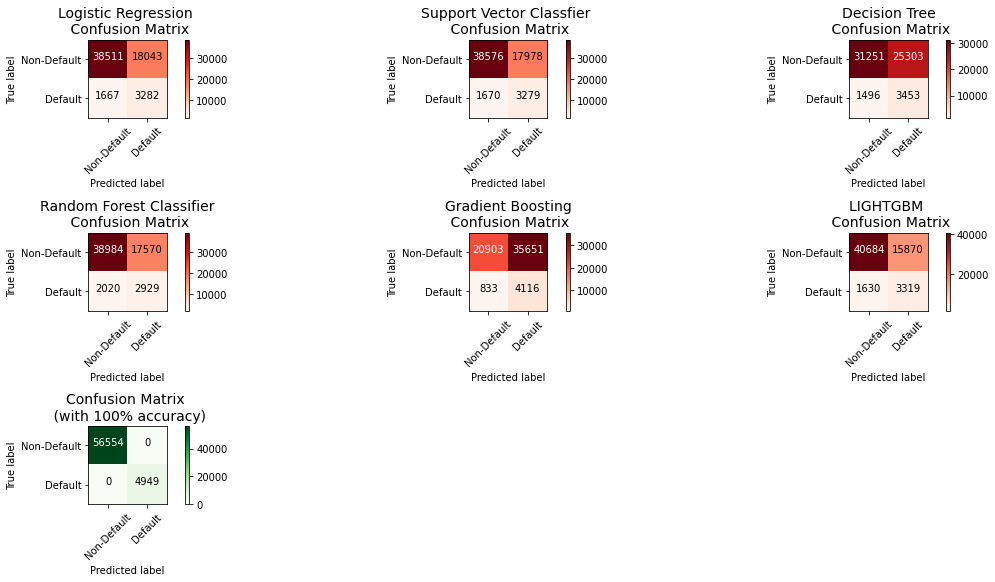

In [50]:
from sklearn.metrics import confusion_matrix
log_reg_cm = confusion_matrix(y_test, log_reg.predict(X_test_stand))
svc_cm = confusion_matrix(y_test, svc.predict(X_test_stand))
dt_cm = confusion_matrix(y_test, decision_tree.predict(X_test_stand))
RF_cm = confusion_matrix(y_test, RandomForest.predict(X_test_stand))
xgboost_cm = confusion_matrix(y_test, (xgboost.predict_proba(X_test_stand)[:,1] >= 0.285).astype(bool))
lightgbm_cm = confusion_matrix(y_test, (lgb.predict_proba(X_test_stand[feats],num_iteration=lgb.best_iteration_)[:,1] >= 0.49).astype(bool))


actual_cm = confusion_matrix(y_test, y_test)
labels = ['Non-Default', 'Default']


fig = plt.figure(figsize=(16,8))

fig.add_subplot(331)
plot_confusion_matrix(log_reg_cm, labels, title="Logistic Regression \n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(332)
plot_confusion_matrix(svc_cm, labels, title="Support Vector Classfier \n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(333)
plot_confusion_matrix(dt_cm, labels, title="Decision Tree\n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(334)
plot_confusion_matrix(RF_cm, labels, title="Random Forest Classifier\n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(335)
plot_confusion_matrix(xgboost_cm, labels, title="Gradient Boosting\n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(336)
plot_confusion_matrix(lightgbm_cm, labels, title="LIGHTGBM \n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(337)
plot_confusion_matrix(actual_cm, labels, title="Confusion Matrix \n (with 100% accuracy)", cmap=plt.cm.Greens)

plt.show()

[-0.78463979 -1.10813752 -0.54238797 -0.16659594 -0.25771622  0.01844649
  0.03493049 -0.26301873 -0.31386927 -0.01619494 -0.012786   -0.28404962
 -0.74617785  0.02901667 -0.19377656  0.02912818 -0.28570904  0.30395704
  0.01390794  0.08738668  0.1861507  -0.01662745  0.0826328  -0.05666595
 -0.05345694 -0.0153967   0.18023536  0.27866539  0.12895833  0.03158562
 -0.30036387  0.38966221  0.05637538]


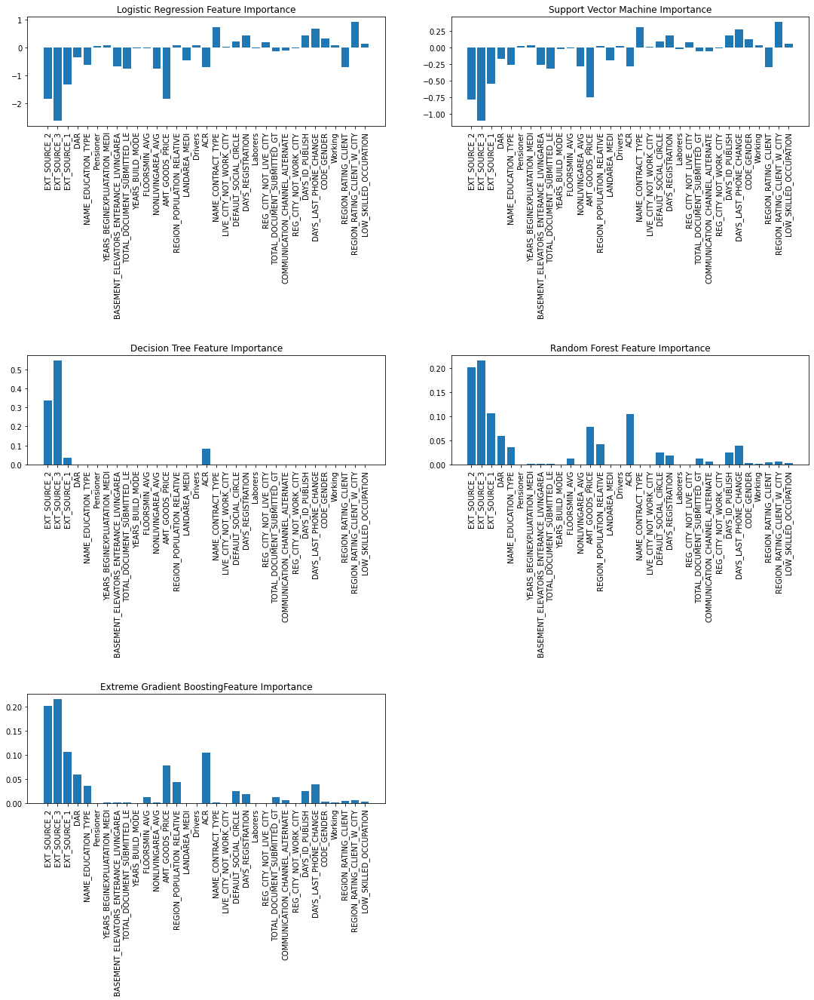

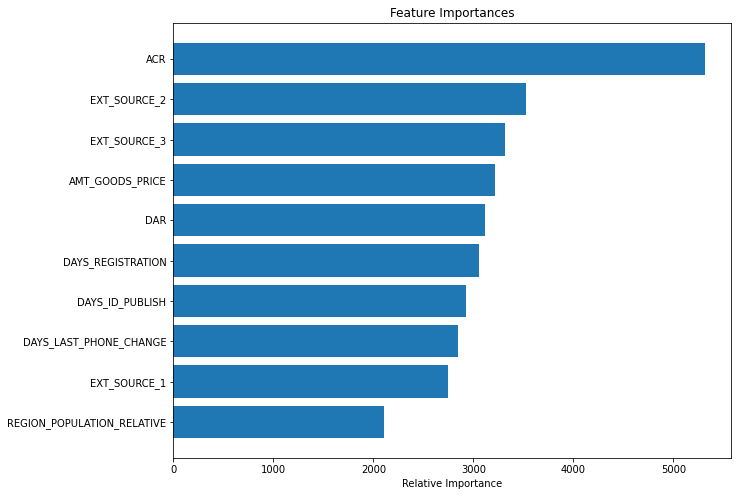

In [84]:
cols = list(X.columns)
plt.figure(figsize=(15,15))

plt.subplot(3,2,1)
importance_log_reg = log_reg.coef_[0]

for i,v in enumerate(importance_log_reg):
    pass
  #  print('Logistic - Regression Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar(cols, importance_log_reg)
plt.xticks(rotation = 90)
plt.title("Logistic Regression Feature Importance")
plt.tight_layout(h_pad = 5, w_pad=5)

plt.subplot(3,2,2)
importance_svc = svc.coef_[0]
print(importance_svc)
for i,v in enumerate(importance_svc):
    pass
   # print('SVM: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar(cols, importance_svc)
plt.xticks(rotation = 90)
plt.title("Support Vector Machine Importance")
plt.tight_layout(h_pad = 5, w_pad=5)

plt.subplot(3,2,3)
# get importance
importance_decision_tree = decision_tree.feature_importances_
# summarize feature importance
for i,v in enumerate(importance_decision_tree):
    pass
	#print('Decision Tree-Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar(cols, importance_decision_tree)
plt.xticks(rotation = 90)
plt.title("Decision Tree Feature Importance")

plt.subplot(3,2,4)
importance_RandomForest = RandomForest.feature_importances_
for i,v in enumerate(importance_RandomForest):
    pass
	#print('Random Forest Feature: %0d, Score: %.5f' % (i,v))

plt.bar(cols, importance_RandomForest)
plt.xticks(rotation = 90)
plt.title("Random Forest Feature Importance")

plt.subplot(3,2,5)
importance_Xgboost = xgboost.feature_importances_
for i,v in enumerate(importance_Xgboost):
    pass
	#print('Extreme Gradient Boosting: %0d, Score: %.5f' % (i,v))

plt.bar(cols, importance_RandomForest)
plt.xticks(rotation = 90)
plt.title("Extreme Gradient BoostingFeature Importance")
plt.xticks(rotation = 90) 


features = X_train.columns
importances = lgb.feature_importances_
indices = np.argsort(importances)

# customized number 
num_features = 10 

plt.figure(figsize=(10,8))
plt.title('Feature Importances')

# only plot the customized number of features
plt.barh(range(num_features), importances[indices[-num_features:]], align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')

plt.show()

In [85]:
import lime #LIME package
import lime.lime_tabular #the type of LIIME analysis we’ll do
import shap #SHAP package

In [86]:
feature_names = X_train_SMOTE.columns

In [87]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_SMOTE.values, 
                                                   feature_names=feature_names, 
                                                   class_names=["Non Default", "Default"], 
                                                   verbose=True, mode='classification')

In [88]:
predict_fn_lg = lambda x: log_reg.predict_proba(x).astype(float)
predict_fn_svm = lambda x: svc._predict_proba_lr(x).astype(float)
predict_fn_dt = lambda x: decision_tree.predict_proba(x).astype(float)
predict_fn_rf = lambda x: RandomForest.predict_proba(x).astype(float)
predict_fn_xgboost = lambda x: xgboost.predict_proba(x).astype(float)
predict_fn_lgb = lambda x: lgb.predict_proba(x).astype(float)

In [89]:
np.random.seed(1)
i = 27
exp_lg = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_lg, num_features=10)
exp_svm = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_svm, num_features=10)
exp_dt = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_dt, num_features=10)
exp_rf = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_rf, num_features=10)

exp_xgboost = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_xgboost, num_features=10)
exp_lgb = explainer.explain_instance(X_train[feature_names].values[i], predict_fn_lgb, num_features=10)
exp_lg.show_in_notebook(show_all=False)

Intercept 0.45754036644936125
Prediction_local [0.22175794]
Right: 0.0
Intercept 0.4827370082366093
Prediction_local [0.23244383]
Right: 0.0
Intercept 0.4506246843559879
Prediction_local [0.50455976]
Right: 0.33120402632597756
Intercept 0.5586043190755314
Prediction_local [0.48338317]
Right: 0.4325115246798068
Intercept 0.8003004336951074
Prediction_local [0.48474751]
Right: 0.2834804654121399
Intercept 0.4058344730138132
Prediction_local [0.19568852]
Right: 0.04953378563090547


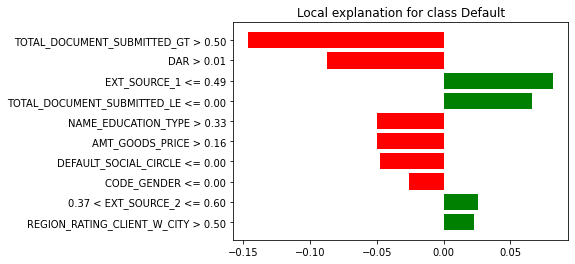

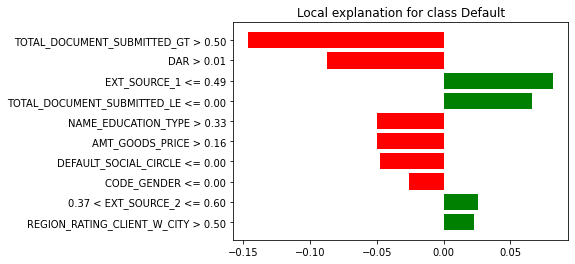

In [90]:
exp_lgb.as_pyplot_figure()

In [91]:
exp_lgb.show_in_notebook()

In [92]:
exp_lg.show_in_notebook()

In [93]:
exp_svm.show_in_notebook()

In [94]:
exp_dt.show_in_notebook()

In [95]:
exp_rf.show_in_notebook()

In [96]:
exp_xgboost.show_in_notebook()

In [64]:
# SHAP implementation
import shap

In [65]:
explainer = shap.TreeExplainer(lgb)
shap_values = explainer.shap_values(X)

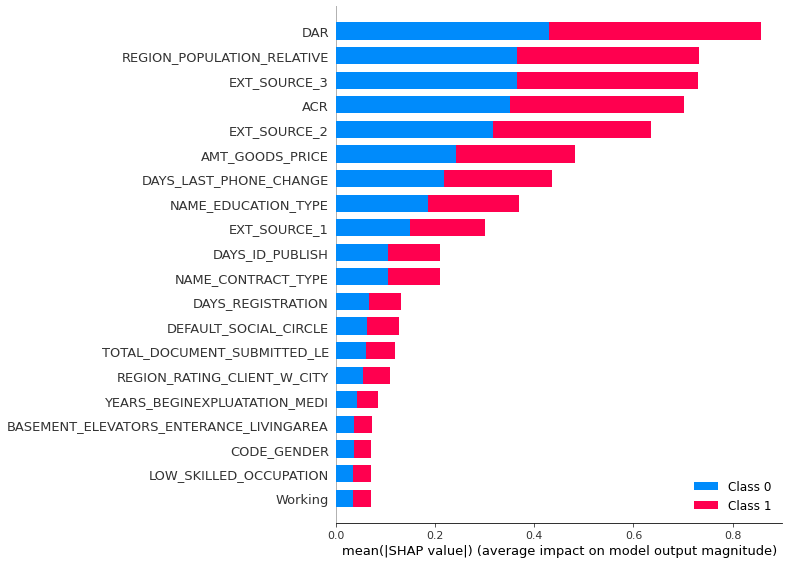

In [66]:
shap.summary_plot(shap_values, X)

In [72]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X.iloc[0,:])

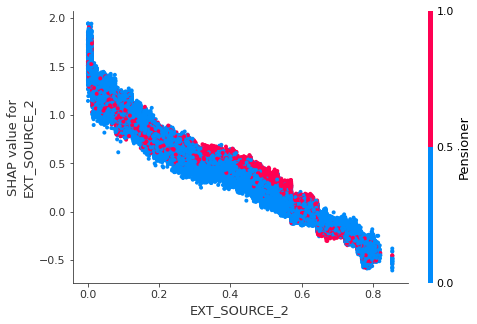

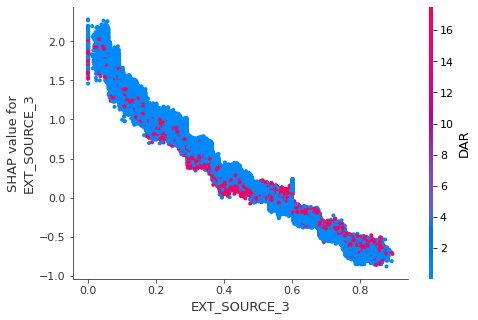

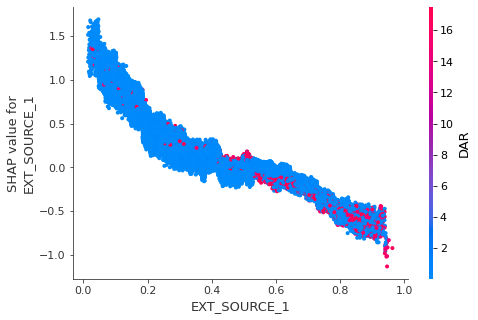

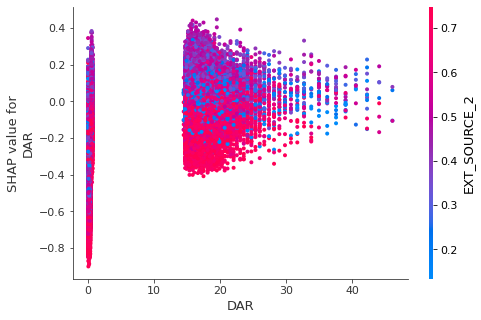

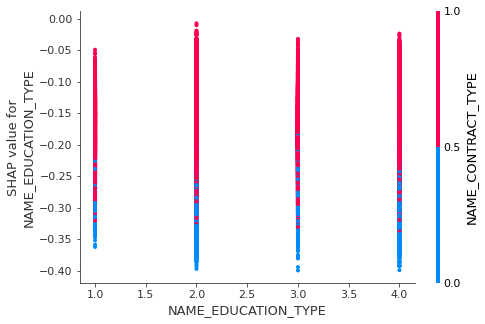

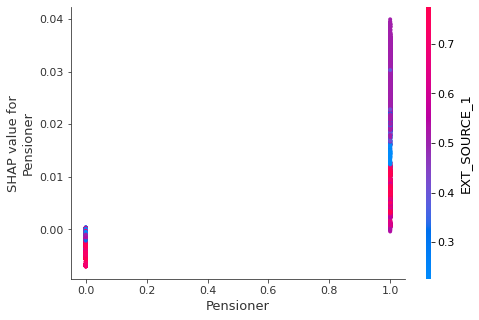

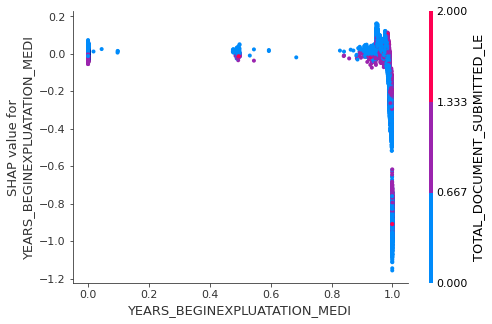

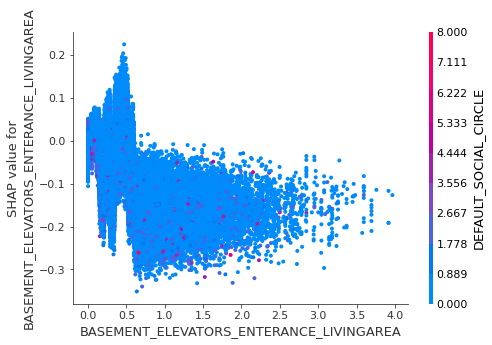

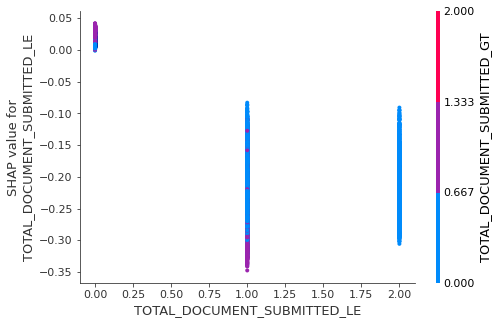

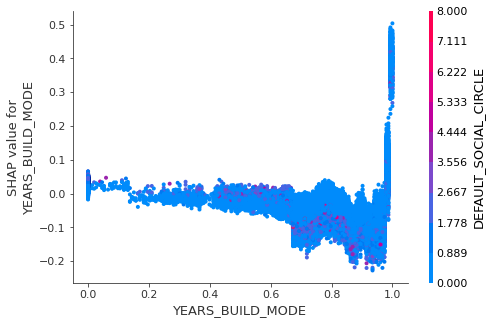

In [69]:
for name in X_train.columns[:10]:
    shap.dependence_plot(name, shap_values[1], X, display_features=X)

In [29]:
X_train.head()

,EXT_SOURCE_2,EXT_SOURCE_3,EXT_SOURCE_1,DAR,NAME_EDUCATION_TYPE,Pensioner,YEARS_BEGINEXPLUATATION_MEDI,BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA,TOTAL_DOCUMENT_SUBMITTED_LE,YEARS_BUILD_MODE,FLOORSMIN_AVG,NONLIVINGAREA_AVG,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,LANDAREA_MEDI,Drivers,ACR,NAME_CONTRACT_TYPE,LIVE_CITY_NOT_WORK_CITY,DEFAULT_SOCIAL_CIRCLE,DAYS_REGISTRATION,Laborers,REG_CITY_NOT_LIVE_CITY,TOTAL_DOCUMENT_SUBMITTED_GT,COMMUNICATION_CHANNEL_ALTERNATE,REG_CITY_NOT_WORK_CITY,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,CODE_GENDER,Working,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,LOW_SKILLED_OCCUPATION
123473,0.358568,0.563835,0.524685,15.851562,2,1,0.0000,0.0000,0,0.0000,0.0000,0.0000,463500.0,0.035792,0.0000,0,0.029475,1,0,0.0,-3595.0,0,0,1,1,0,-4408,-2058.0,0,0,2,2,0.0
10118,0.490305,0.595456,0.244926,0.011111,2,0,0.9742,0.2606,0,0.6602,0.2083,0.0149,171000.0,0.010032,0.0416,0,0.119335,1,0,0.0,-4281.0,1,0,1,3,0,-3399,-73.0,1,1,2,2,1.0
64716,0.643404,0.706205,0.510000,0.093750,1,0,0.0000,0.0000,1,0.0000,0.0000,0.0000,648000.0,0.035792,0.0000,1,0.032427,1,0,0.0,-5680.0,0,0,0,2,0,-5009,-1959.0,1,1,2,2,1.0
234940,0.426431,0.506484,0.288642,0.236111,2,0,0.9841,0.5032,0,0.7909,0.0417,0.2368,900000.0,0.030755,0.0380,0,0.040875,1,1,0.0,-2618.0,0,0,0,3,1,-2751,-531.0,1,0,2,2,0.0
236051,0.445701,0.528093,0.790210,0.223485,2,0,0.0000,0.0000,0,0.0000,0.0000,0.0000,477000.0,0.025164,0.0000,0,0.039901,1,0,1.0,-8006.0,1,0,1,2,0,-5001,-9.0,1,0,2,2,1.0


In [30]:
final_cols = list(X_train.columns)

final_cols

['EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'EXT_SOURCE_1',
 'DAR',
 'NAME_EDUCATION_TYPE',
 'Pensioner',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA',
 'TOTAL_DOCUMENT_SUBMITTED_LE',
 'YEARS_BUILD_MODE',
 'FLOORSMIN_AVG',
 'NONLIVINGAREA_AVG',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'LANDAREA_MEDI',
 'Drivers',
 'ACR',
 'NAME_CONTRACT_TYPE',
 'LIVE_CITY_NOT_WORK_CITY',
 'DEFAULT_SOCIAL_CIRCLE',
 'DAYS_REGISTRATION',
 'Laborers',
 'REG_CITY_NOT_LIVE_CITY',
 'TOTAL_DOCUMENT_SUBMITTED_GT',
 'COMMUNICATION_CHANNEL_ALTERNATE',
 'REG_CITY_NOT_WORK_CITY',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'CODE_GENDER',
 'Working',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'LOW_SKILLED_OCCUPATION']

In [31]:
# Final  Model - XgBoost
lgb_final_pred = pd.DataFrame(lgb.predict_proba(df_stand[final_cols]),columns = ["NON_DEFAULT", "DEFAULT"])

In [32]:
lgb_final_pred.head()

,NON_DEFAULT,DEFAULT
0,0.095609,0.904391
1,0.786676,0.213324
2,0.672025,0.327975
3,0.649378,0.350622
4,0.481589,0.518411


In [33]:
Application_score = pd.merge(lgb_final_pred, df, left_index=True, right_index=True)
Application_score.head()

,NON_DEFAULT,DEFAULT,EXT_SOURCE_2,EXT_SOURCE_3,EXT_SOURCE_1,DAR,NAME_EDUCATION_TYPE,Pensioner,YEARS_BEGINEXPLUATATION_MEDI,BASEMENT_ELEVATORS_ENTERANCE_LIVINGAREA,TOTAL_DOCUMENT_SUBMITTED_LE,YEARS_BUILD_MODE,FLOORSMIN_AVG,NONLIVINGAREA_AVG,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,LANDAREA_MEDI,Drivers,ACR,NAME_CONTRACT_TYPE,LIVE_CITY_NOT_WORK_CITY,DEFAULT_SOCIAL_CIRCLE,DAYS_REGISTRATION,Laborers,REG_CITY_NOT_LIVE_CITY,TOTAL_DOCUMENT_SUBMITTED_GT,COMMUNICATION_CHANNEL_ALTERNATE,REG_CITY_NOT_WORK_CITY,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,CODE_GENDER,Working,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,LOW_SKILLED_OCCUPATION,SK_ID_CURR,TARGET
0,0.095609,0.904391,0.262949,0.139376,0.083037,0.070513,2,0,0.9722,0.1249,0,0.6341,0.1250,0.0000,351000.0,0.018801,0.0375,0,0.060749,1,0,4.0,-3648.0,1,0,1,2,0,-2120,-1134.0,1,1,2,2,1.0,100002,1
1,0.786676,0.213324,0.622246,0.540000,0.311267,0.072464,4,0,0.9851,0.2223,0,0.8040,0.3333,0.0098,1129500.0,0.003541,0.0132,0,0.027598,1,0,0.0,-1186.0,0,0,1,2,0,-291,-828.0,0,0,1,1,0.0,100003,0
2,0.672025,0.327975,0.555912,0.729567,0.510000,0.012579,2,0,0.0000,0.0000,0,0.0000,0.0000,0.0000,135000.0,0.010032,0.0000,0,0.050000,0,0,0.0,-4260.0,1,0,0,3,0,-2531,-815.0,1,1,2,2,1.0,100004,0
3,0.649378,0.350622,0.650442,0.540000,0.510000,0.160377,2,0,0.0000,0.0000,0,0.0000,0.0000,0.0000,297000.0,0.008019,0.0000,0,0.094941,1,0,0.0,-9833.0,1,0,1,2,0,-2437,-617.0,0,1,2,2,1.0,100006,0
4,0.481589,0.518411,0.322738,0.540000,0.510000,0.154545,2,0,0.0000,0.0000,1,0.0000,0.0000,0.0000,513000.0,0.028663,0.0000,0,0.042623,1,1,0.0,-4311.0,0,0,0,2,1,-3458,-1106.0,1,1,2,2,0.0,100007,0


In [35]:
Application_score = Application_score[["SK_ID_CURR","DEFAULT", "TARGET"]]

In [36]:
#Application_score.columns = ["SK_ID_CURR", "TARGET"]
Application_score.head(10)

,SK_ID_CURR,DEFAULT,TARGET
0,100002,0.904391,1
1,100003,0.213324,0
2,100004,0.327975,0
3,100006,0.350622,0
4,100007,0.518411,0
5,100008,0.377775,0
6,100009,0.070271,0
7,100010,0.141932,0
8,100011,0.206420,0
9,100012,0.187993,0


In [37]:
Application_score.to_csv("Scores/application_score.csv", index= False)